# visualize or_matseg dataset

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


100%|██████████| 20/20 [00:00<00:00, 17667.67it/s]

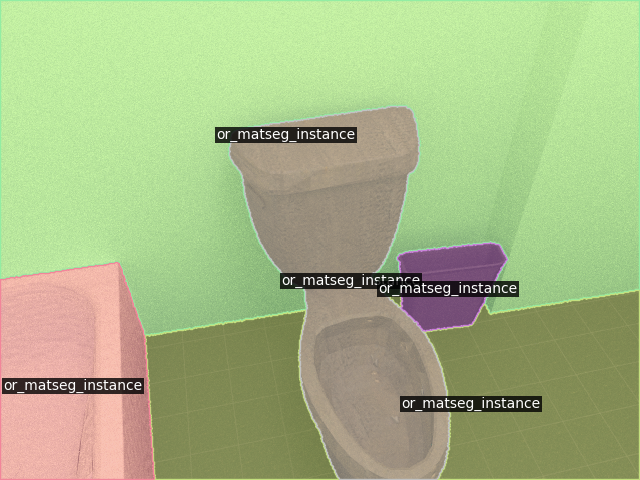

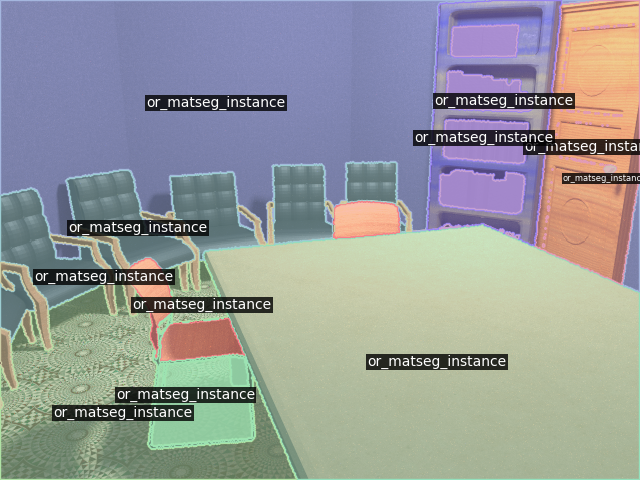

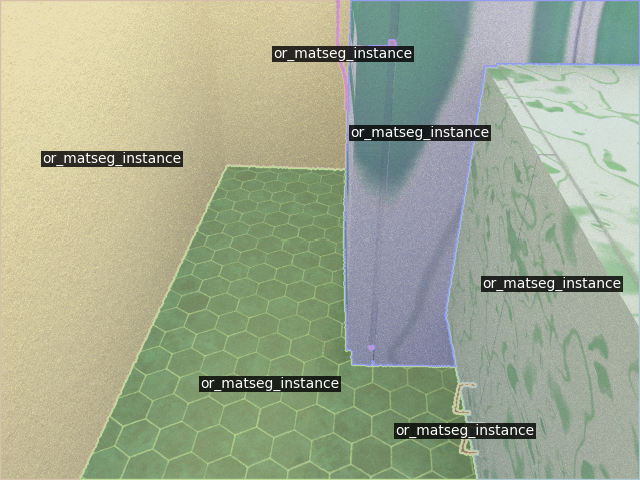

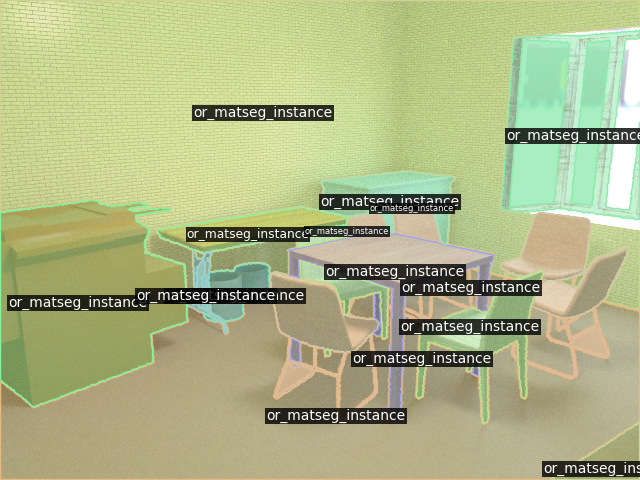

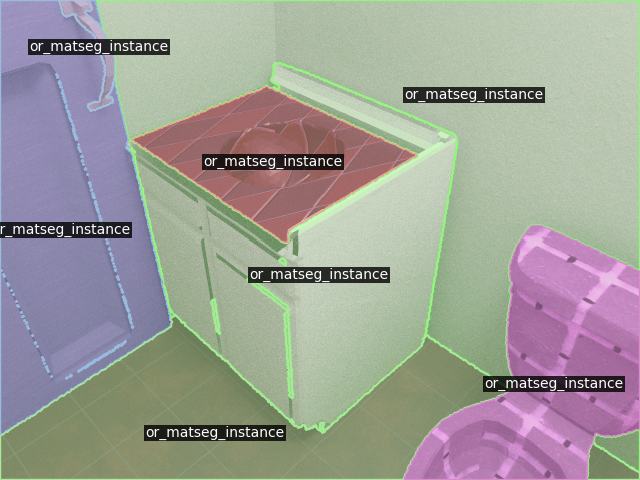

...

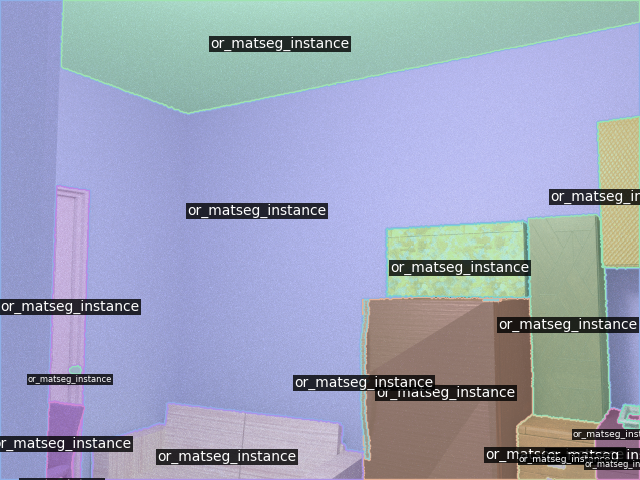

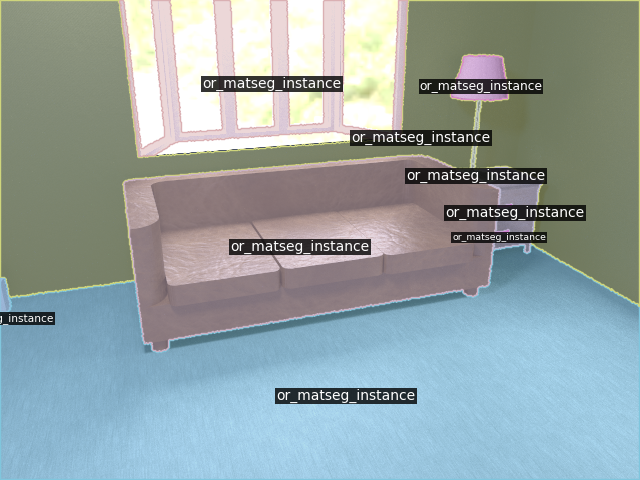

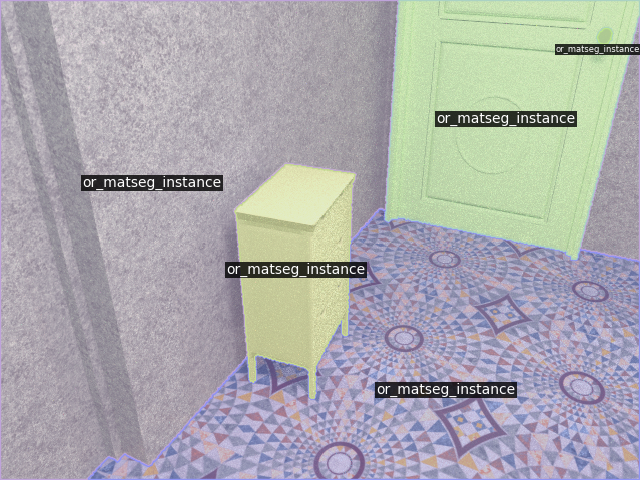

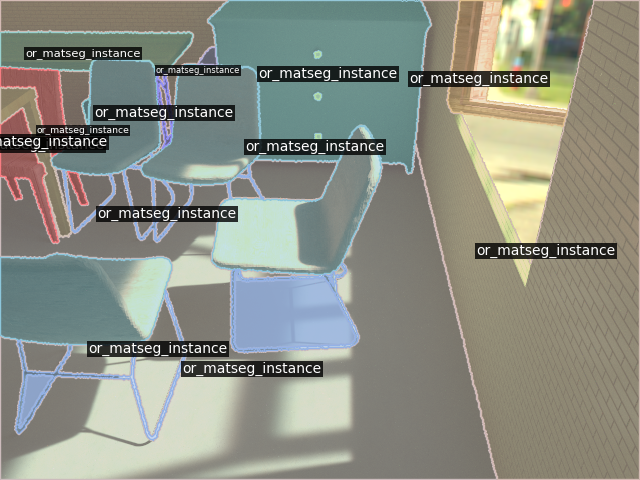

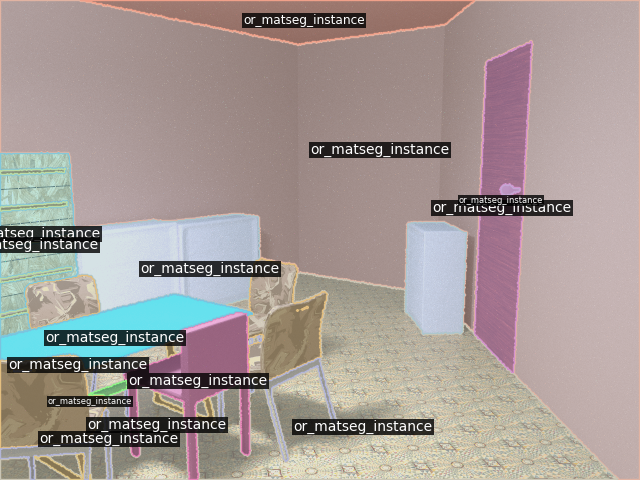

In [11]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
import sys
import os
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
# print(sys.path)

# from mask2former.data.datasets.register_or_matseg_panoptic import register_all_or_matseg_panoptic
# _root = os.getenv("DETECTRON2_DATASETS", "../datasets")
# register_all_or_matseg_panoptic(_root)

from detectron2.data import MetadataCatalog, DatasetCatalog
from panopticapi import utils as panopticapi_utils
or_matseg_panoptic_metadata = MetadataCatalog.get("or_matseg_panoptic_val")

from mask2former.data.datasets.register_or_matseg_panoptic import load_or_matseg_panoptic_json, get_metadata
metadata = get_metadata()
panoptic_json = '/data/OpenRooms_public/im_matseg_pan_seg_rgb_val.json'
assert Path(panoptic_json).exists(), panoptic_json
image_root = '/data/OpenRooms_public'
panoptic_root = '/data/OpenRooms_public/im_matseg_pan_seg_rgb'

dataset_dicts = load_or_matseg_panoptic_json(
    panoptic_json, image_root, panoptic_root, metadata
)

import random
import cv2
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow

# for d in random.sample(dataset_dicts, 1):
# d = dataset_dicts[2]
for d in dataset_dicts:
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=or_matseg_panoptic_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

    pan_seg_file_name = d['pan_seg_file_name']
    assert Path(pan_seg_file_name).exists()


In [13]:
d

{'file_name': '/data/OpenRooms_public/mainDiffMat_xml/scene0403_01/im_sdr/im_12.png',
 'image_id': 1,
 'pan_seg_file_name': '/data/OpenRooms_public/im_matseg_pan_seg_rgb/main_xml/scene0403_01/im_matseg_pan_seg_rgb_12.png',
 'segments_info': [{'id': 1,
   'category_id': 0,
   'iscrowd': 0,
   'isthing': True,
   'isstuff': 0,
   'area': 92448.0},
  {'id': 2,
   'category_id': 0,
   'iscrowd': 0,
   'isthing': True,
   'isstuff': 0,
   'area': 15835.0},
  {'id': 3,
   'category_id': 0,
   'iscrowd': 0,
   'isthing': True,
   'isstuff': 0,
   'area': 11043.0},
  {'id': 4,
   'category_id': 0,
   'iscrowd': 0,
   'isthing': True,
   'isstuff': 0,
   'area': 5608.0},
  {'id': 5,
   'category_id': 0,
   'iscrowd': 0,
   'isthing': True,
   'isstuff': 0,
   'area': 25145.0},
  {'id': 6,
   'category_id': 0,
   'iscrowd': 0,
   'isthing': True,
   'isstuff': 0,
   'area': 1518.0},
  {'id': 7,
   'category_id': 0,
   'iscrowd': 0,
   'isthing': True,
   'isstuff': 0,
   'area': 6852.0},
  {'id'

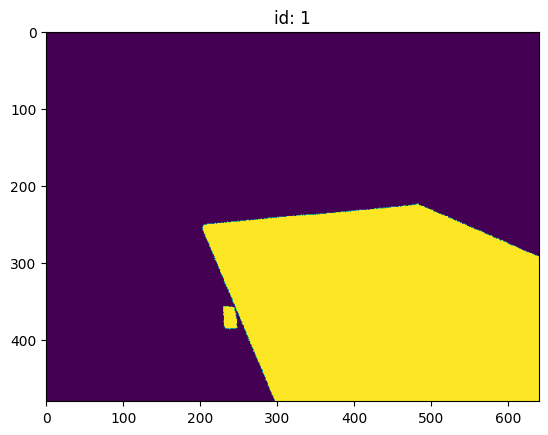

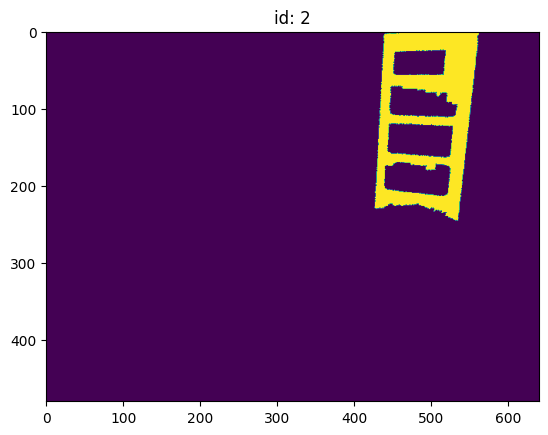

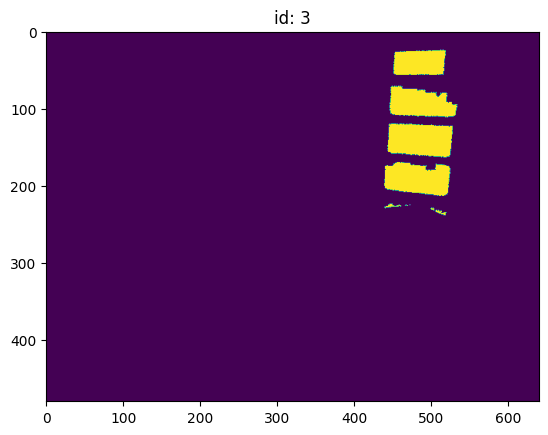

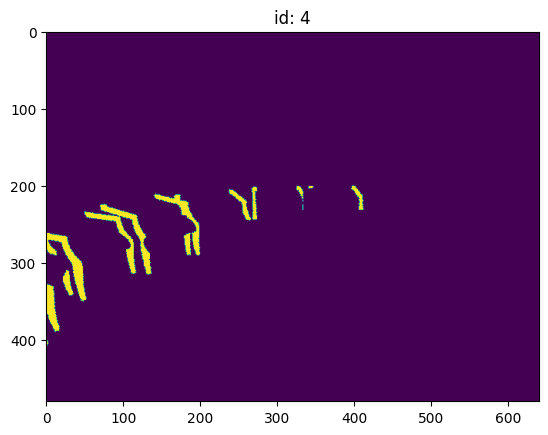

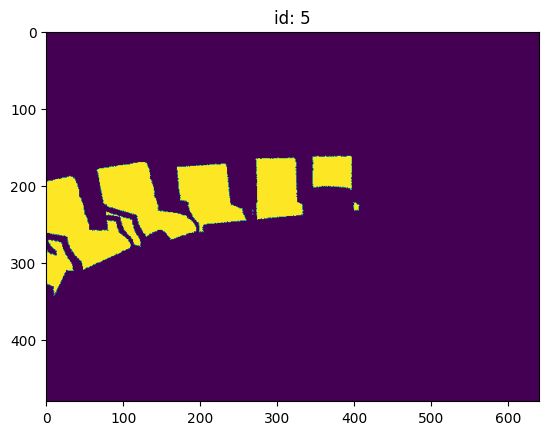

...

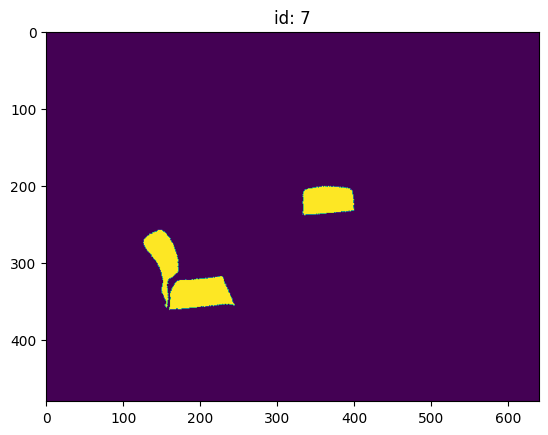

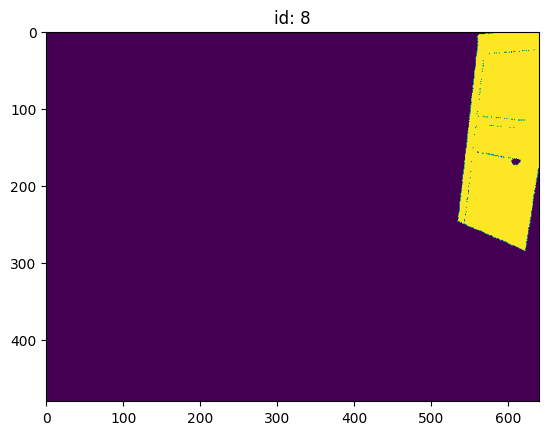

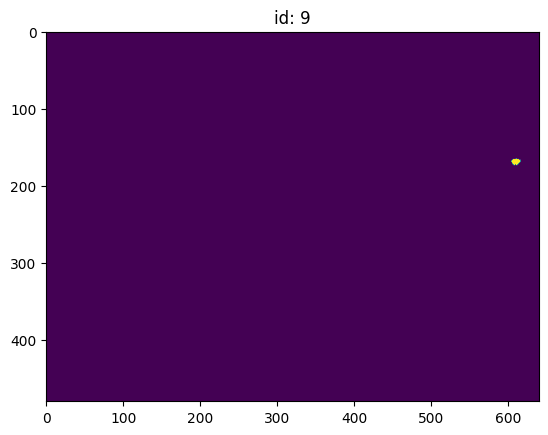

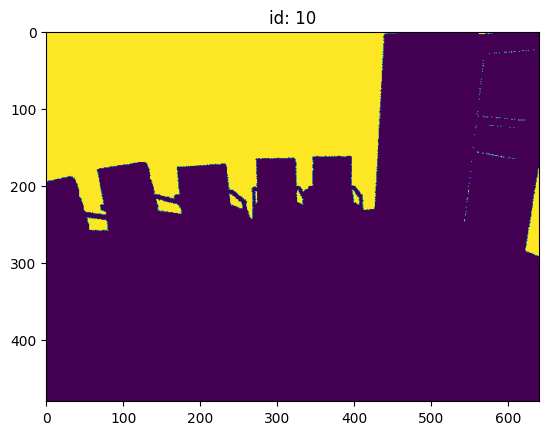

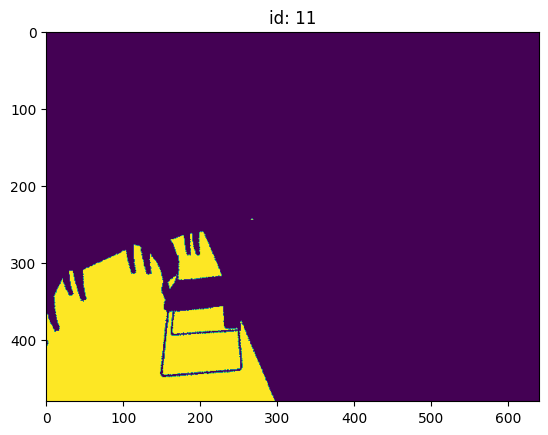

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
d = dataset_dicts[1]
im_pan_seg_rgb = cv2.imread(d.get('pan_seg_file_name'))[:, :, ::-1].astype(np.int16)
im_pan_seg_ids = panopticapi_utils.rgb2id(im_pan_seg_rgb)

for _ in np.unique(im_pan_seg_ids):
    plt.figure()
    plt.imshow(im_pan_seg_ids == _)
    plt.title('id: {}'.format(_))
    plt.show()
